<a href="https://colab.research.google.com/github/JulioLaz/telecom_churn/blob/main/Telecom_Churn_Data_Cleaning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**PROBLEMA DE NEGOCIO**


---




##Una empresa de telecomunicaciones desea mejorar la retención de sus clientes, identificando aquellos que tienen más chances de abandonar el servicio (Churn). Como científico de datos, tu objetivo será limpiar y preparar un conjunto de datos para el entrenamiento de un modelo de Churn. A continuación, se presentan las preguntas clave que guiarán el proceso de limpieza de datos:

### **Preguntas**

1. ¿Qué insights podemos obtener del análisis exploratorio inicial del conjunto de datos?

2. ¿Qué transformaciones básicas son necesarias para preparar los datos?

3. ¿Cómo podemos identificar y tratar los datos duplicados y los valores nulos?

4. ¿Cómo manejamos los outliers presentes en el dataset?

5. ¿Qué técnicas aplicamos para procesar las variables categóricas?

#**1. Configuración del Ambiente**


---




In [616]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
import seaborn as sns
import matplotlib.pyplot as plt
import json
import requests
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import RFECV
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
global datos_churn

#**2. Obtención y Tratamiento de Datos**


---




##**2.1 Cargando las bases de datos**

In [704]:
def lectura_datos():
    global datos_churn
    url ="https://raw.githubusercontent.com/iknazio98/Ds_Telecom_Churn-/refs/heads/main/base_clientes.json"
    json = pd.read_json(url)
    #Tu código aquí
    response = requests.get(url)
    json_bruto = response.json() 
    datos_churn = pd.json_normalize(json_bruto)
    return datos_churn

In [705]:
lectura_datos()
datos_churn.head()

,id_cliente,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,0002-ORFBO,no,femenino,0,si,si,9.0,si,no,DSL,no,si,no,si,si,no,None,None,None,NaN,None
1,0003-MKNFE,no,masculino,0,no,no,9.0,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,59.9,542.4
2,0004-TLHLJ,si,masculino,0,no,no,4.0,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,73.9,280.85
3,0011-IGKFF,si,masculino,1,si,no,13.0,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,98.0,1237.85
4,0013-EXCHZ,si,femenino,1,si,no,3.0,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,83.9,267.4


##**2.2 Tratamiento de datos**

In [706]:
url_txt = "https://raw.githubusercontent.com/iknazio98/Ds_Telecom_Churn-/refs/heads/main/Diccionario.txt"
response = requests.get(url_txt) # Hacer la solicitud GET a la URL

if response.status_code == 200:  # Verificar si la solicitud fue exitosa (status code 200)
    contenido = response.text    # El contenido del archivo
    print(contenido)
else:
    print(f"Error al acceder al archivo: {response.status_code}")

La base de datos contiene columnas además del ID de los clientes y el churn:

Cliente:
género: género (masculino y femenino)
anciano: información sobre si un cliente tiene o no una edad igual o mayor a 65 años
pareja: si el cliente tiene o no una pareja
dependientes: si el cliente tiene o no dependientes
tiempo_servicio: meses de contrato del cliente

Servicio de telefonía:
servicio_telefono: suscripción al servicio telefónico
varias_lineas: suscripción a más de una línea telefónica

Servicio de internet:
servicio_internet: suscripción a un proveedor de internet
seguridad_online: suscripción adicional a seguridad en línea
backup_online: suscripción adicional a copias de seguridad en línea
proteccion_dispositivo: suscripción adicional a protección en el dispositivo
soporte_tecnico: suscripción adicional a soporte técnico, menos tiempo de espera
tv_streaming: suscripción a TV por cable
peliculas_streaming: suscripción a streaming de películas

Cuenta:
contrato: tipo de contrato
factura_e

In [707]:
datos_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7344 entries, 0 to 7343
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   id_cliente                       7344 non-null   object 
 1   Churn                            7344 non-null   object 
 2   cliente.genero                   7344 non-null   object 
 3   cliente.anciano                  7344 non-null   int64  
 4   cliente.pareja                   7344 non-null   object 
 5   cliente.dependientes             7344 non-null   object 
 6   cliente.tiempo_servicio          7336 non-null   float64
 7   telefono.servicio_telefono       7344 non-null   object 
 8   telefono.varias_lineas           7344 non-null   object 
 9   internet.servicio_internet       7344 non-null   object 
 10  internet.seguridad_online        7344 non-null   object 
 11  internet.backup_online           7344 non-null   object 
 12  internet.proteccion_

In [708]:
#Se eliminan debido a que es imposible imputar estos datos 
datos_churn[(datos_churn["cuenta.cobros.Total"].isna()) & (datos_churn["cuenta.cobros.mensual"].isna())].loc[:,["cliente.tiempo_servicio","cuenta.contrato","cuenta.cobros.mensual","cuenta.cobros.Total"]]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.cobros.mensual,cuenta.cobros.Total
0,9.0,None,NaN,None
1646,23.0,None,NaN,None
1647,55.0,None,NaN,None
2087,40.0,None,NaN,None
4852,5.0,None,NaN,None
4856,62.0,None,NaN,None
4862,1.0,None,NaN,None
4874,56.0,None,NaN,None
4896,18.0,None,NaN,None
5567,22.0,None,NaN,None


In [709]:
#Guardo los index para luego elimnarlos
idx = datos_churn[(datos_churn["cuenta.cobros.Total"].isna()) & (datos_churn["cuenta.cobros.mensual"].isna())].index
idx

Index([0, 1646, 1647, 2087, 4852, 4856, 4862, 4874, 4896, 5567, 5569, 7299], dtype='int64')

In [710]:
#Elimino los index
datos_churn = datos_churn.drop(idx)

In [711]:
datos_churn.shape

(7332, 21)

In [712]:
#Reemplazo los valores vacios en 'cuenta.cobros.Total' por Nan y cambio los valores a float
datos_churn['cuenta.cobros.Total'] = datos_churn['cuenta.cobros.Total'].replace(['', ' '], np.nan).astype(float)

In [713]:
# Se revisan los valores NaN en "cuenta.cobros.mensual" para determinar la mejor manera de abordarlos.
# A partir de este punto, se asume que "cuenta.cobros.Total" es igual a "cuenta.cobros.mensual" multiplicado por "cliente.tiempo_servicio", más un cobro adicional o descuento. 
# Dado que no es posible identificar dicho cobro o descuento, se procederá utilizando únicamente la multiplicación, 
# lo que permite aproximarse a un valor cercano al real.
datos_churn[datos_churn["cuenta.cobros.mensual"].isna()].loc[:, ["cliente.tiempo_servicio", "cuenta.contrato", "cuenta.cobros.mensual", "cuenta.cobros.Total"]]


,cliente.tiempo_servicio,cuenta.contrato,cuenta.cobros.mensual,cuenta.cobros.Total
452,67.0,None,NaN,6886.25
994,21.0,None,NaN,1565.70
1649,9.0,mensual,NaN,890.60
5562,45.0,None,NaN,4368.85
5575,56.0,None,NaN,4824.45
6187,62.0,None,NaN,7159.05


In [714]:
# Se revisa la posibilidad de imputar los valores de "cuenta.contrato" de alguna manera.
datos_churn[datos_churn["cuenta.contrato"].isna()].loc[:, ["cliente.tiempo_servicio", "cuenta.contrato", "cuenta.cobros.mensual", "cuenta.cobros.Total"]]


,cliente.tiempo_servicio,cuenta.contrato,cuenta.cobros.mensual,cuenta.cobros.Total
452,67.0,None,NaN,6886.25
994,21.0,None,NaN,1565.70
1645,18.0,None,20.05,NaN
2089,50.0,None,103.05,5153.50
4858,30.0,None,110.45,3327.05
4866,1.0,None,70.30,70.30
4869,72.0,None,83.55,NaN
4872,42.0,None,104.75,NaN
4879,43.0,None,104.60,4759.85
4892,62.0,None,84.95,5150.55


In [715]:
# Siguiendo la lógica de que "cuenta.cobros.Total" es igual a "cuenta.cobros.mensual" multiplicado por "cliente.tiempo_servicio",
# se procede a imputar los datos de "cliente.tiempo_servicio".
datos_churn[datos_churn["cliente.tiempo_servicio"].isna()].loc[:, ["cliente.tiempo_servicio", "cuenta.contrato", "cuenta.cobros.mensual", "cuenta.cobros.Total"]]


,cliente.tiempo_servicio,cuenta.contrato,cuenta.cobros.mensual,cuenta.cobros.Total
9,NaN,dos años,90.45,5957.90
181,NaN,mensual,29.30,355.90
186,NaN,mensual,63.95,318.10
773,NaN,dos años,101.05,5971.25
3624,NaN,dos años,76.10,1054.80
5434,NaN,un año,20.60,116.60
5437,NaN,un año,73.85,3581.40
6316,NaN,un año,69.05,1958.45


In [716]:
# 
datos_churn[(datos_churn["cuenta.cobros.Total"].isna()) &(datos_churn["cliente.tiempo_servicio"]!=0.0)].loc[:,["cliente.tiempo_servicio","cuenta.contrato","cuenta.cobros.mensual","cuenta.cobros.Total"]]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.cobros.mensual,cuenta.cobros.Total
1645,18.0,None,20.05,NaN
4869,72.0,None,83.55,NaN
4872,42.0,None,104.75,NaN
4886,60.0,dos años,20.95,NaN


In [717]:
# Se decidió imputar el valor de "cuenta.cobros.Total" utilizando el mismo valor presente en "cuenta.cobros.mensual".
# Inicialmente, se consideró asignar un valor de 0, bajo el razonamiento de que los clientes podrían haber contratado recientemente los planes.
# También se evaluó la posibilidad de imputar el valor de "cliente.tiempo_servicio" mediante el análisis de su distribución en relación con "cuenta.contrato" cuando el contrato es de dos años.
datos_churn[(datos_churn["cuenta.cobros.Total"].isna()) & (datos_churn["cliente.tiempo_servicio"] == 0.0)].loc[:, ["cliente.tiempo_servicio", "cuenta.contrato", "cuenta.cobros.mensual", "cuenta.cobros.Total"]]


,cliente.tiempo_servicio,cuenta.contrato,cuenta.cobros.mensual,cuenta.cobros.Total
975,0.0,dos años,56.05,NaN
1775,0.0,dos años,20.00,NaN
1955,0.0,dos años,61.90,NaN
2075,0.0,dos años,19.70,NaN
2232,0.0,dos años,20.25,NaN
2308,0.0,dos años,25.35,NaN
2930,0.0,dos años,73.35,NaN
3134,0.0,dos años,25.75,NaN
3203,0.0,dos años,52.55,NaN
4169,0.0,dos años,80.85,NaN


In [718]:
# Se decidió analizar la relación entre 'cuenta.contrato' y 'cliente.tiempo_servicio' utilizando datos_churn.groupby('cuenta.contrato')['cliente.tiempo_servicio'].describe().
# A partir de este análisis, se generaron intervalos de tiempo con el fin de imputar los valores faltantes de "cuenta.contrato".
datos_churn[datos_churn["cuenta.contrato"].isna()].loc[:, ["cliente.tiempo_servicio", "cuenta.contrato", "cuenta.cobros.mensual", "cuenta.cobros.Total"]]


,cliente.tiempo_servicio,cuenta.contrato,cuenta.cobros.mensual,cuenta.cobros.Total
452,67.0,None,NaN,6886.25
994,21.0,None,NaN,1565.70
1645,18.0,None,20.05,NaN
2089,50.0,None,103.05,5153.50
4858,30.0,None,110.45,3327.05
4866,1.0,None,70.30,70.30
4869,72.0,None,83.55,NaN
4872,42.0,None,104.75,NaN
4879,43.0,None,104.60,4759.85
4892,62.0,None,84.95,5150.55


In [719]:
#Podemos notar outliers 
grouped_describe = datos_churn.groupby('cuenta.contrato')['cliente.tiempo_servicio'].describe()
print(grouped_describe)

                  count       mean        std  min   25%   50%   75%     max
cuenta.contrato                                                             
dos años         1752.0  56.765982  18.178945  0.0  48.0  64.0  71.0    72.0
mensual          4037.0  18.973000  32.036843  1.0   3.0  12.0  29.0  1000.0
un año           1515.0  44.145875  42.075644  1.0  27.0  44.0  58.0  1080.0


In [720]:
# Misma lógica de "cuenta.cobros.Total" = "cuenta.cobros.mensual" * "cliente.tiempo_servicio" 
datos_churn[datos_churn["cuenta.cobros.mensual"].isna()].loc[:,["cliente.tiempo_servicio","cuenta.contrato","cuenta.cobros.mensual","cuenta.cobros.Total"]]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.cobros.mensual,cuenta.cobros.Total
452,67.0,None,NaN,6886.25
994,21.0,None,NaN,1565.70
1649,9.0,mensual,NaN,890.60
5562,45.0,None,NaN,4368.85
5575,56.0,None,NaN,4824.45
6187,62.0,None,NaN,7159.05


In [721]:
datos_churn["cuenta.cobros.mensual"] = np.where(datos_churn["cuenta.cobros.mensual"].isna(),datos_churn["cuenta.cobros.Total"]/datos_churn["cliente.tiempo_servicio"],datos_churn["cuenta.cobros.mensual"] )

In [722]:
# Imputar por la moda 
datos_churn['cuenta.facturacion_electronica'].fillna(datos_churn['cuenta.facturacion_electronica'].mode()[0], inplace=True)
datos_churn['cuenta.metodo_pago'].fillna(datos_churn['cuenta.metodo_pago'].mode()[0], inplace=True)

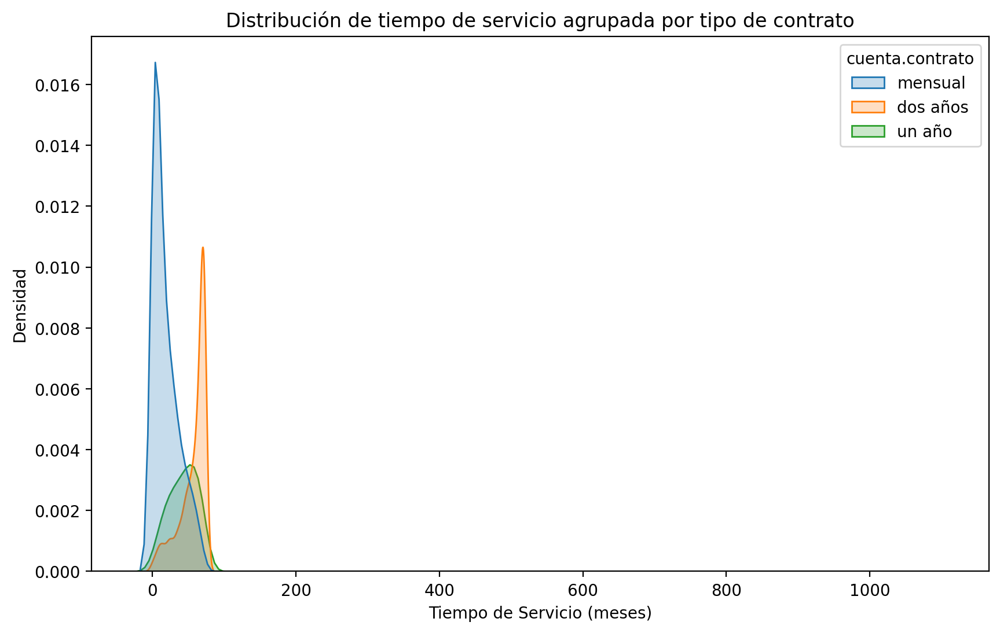

In [723]:
# Crear un gráfico de densidad (KDE) para la columna 'cliente_tiempo_servicio' agrupada por 'cuenta_contrato'
plt.figure(figsize=(10, 6))

# Gráfico KDE (curvas de densidad) para ver la distribución
sns.kdeplot(data=datos_churn, x='cliente.tiempo_servicio', hue='cuenta.contrato', fill=True)

# Personalizar el gráfico
plt.title('Distribución de tiempo de servicio agrupada por tipo de contrato')
plt.xlabel('Tiempo de Servicio (meses)')
plt.ylabel('Densidad')

# Mostrar el gráfico
plt.show()

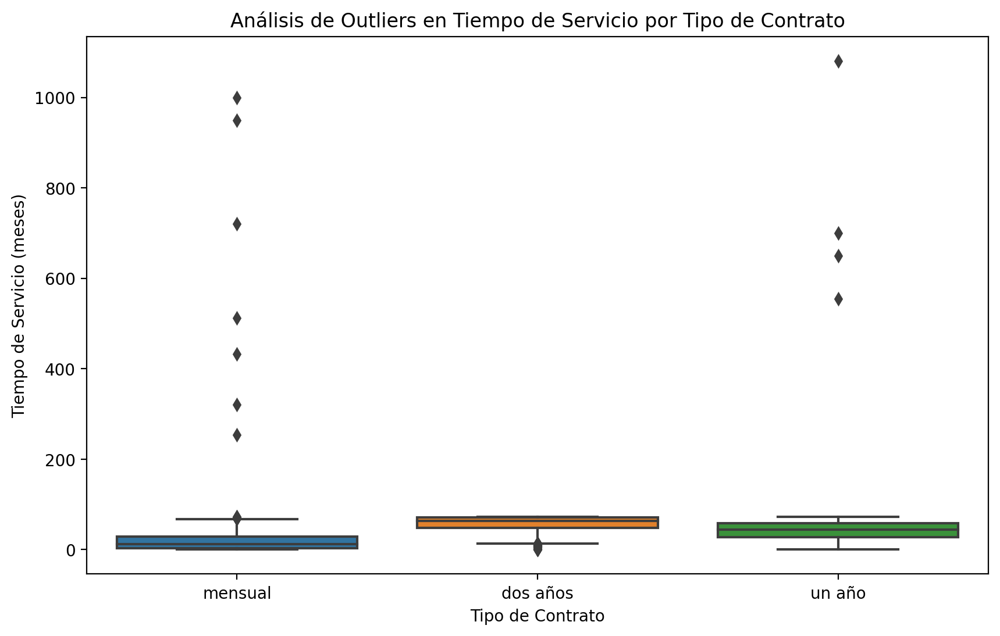

In [724]:
def boxplot(df):
    # Graficar boxplots para detectar outliers en cada tipo de contrato
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x='cuenta.contrato', y='cliente.tiempo_servicio')


    # Personalizar el gráfico
    plt.title('Análisis de Outliers en Tiempo de Servicio por Tipo de Contrato')
    plt.xlabel('Tipo de Contrato')
    plt.ylabel('Tiempo de Servicio (meses)')

    # Mostrar el gráfico
    plt.show()
boxplot(datos_churn)

In [725]:
def aplicar_iqr(df, column):

    # Calcular el primer cuartil (Q1) y el tercer cuartil (Q3)
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    
    # Calcular el rango intercuartílico (IQR)
    IQR = Q3 - Q1
    
    # Definir los límites superior e inferior
    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 1.5 * IQR
    
    # Filtrar los valores dentro de los límites 
    df_sin_outliers = df[(df[column] >= limite_inferior) & (df[column] <= limite_superior)]
    
    return df_sin_outliers

In [726]:
def preprocesamiento():
    global datos_churn
    # Leer y cargar los datos
    lectura_datos()

    # Se eliminan los registros donde la columna 'Churn' está vacía, ya que no es posible imputarlos
    datos_churn = datos_churn[datos_churn["Churn"] != ""]

    # Se eliminan filas donde tanto 'cuenta.cobros.Total' como 'cuenta.cobros.mensual' sean NaN, debido a que no se pueden imputar de manera confiable
    idx = datos_churn[(datos_churn["cuenta.cobros.Total"].isna()) & (datos_churn["cuenta.cobros.mensual"].isna())].index
    datos_churn = datos_churn.drop(idx)

    # Reemplazo de valores vacíos en 'cuenta.cobros.Total' y conversión a tipo float
    datos_churn['cuenta.cobros.Total'] = datos_churn['cuenta.cobros.Total'].replace(['', ' '], np.nan).astype(float)

    # Imputación de valores en 'cuenta.cobros.Total' cuando 'cliente.tiempo_servicio' es 0
    # El razonamiento es que cuando el tiempo de servicio es 0, es razonable asumir que 'cuenta.cobros.Total' también debería ser 0, por lo que se asigna este valor
    datos_churn["cuenta.cobros.Total"] = np.where(
        datos_churn["cliente.tiempo_servicio"] == 0.0, 
        0, 
        datos_churn["cuenta.cobros.Total"]
    )

    # Imputación de valores en 'cliente.tiempo_servicio' basado en otras columnas
    # Si el valor está ausente, se utiliza la relación: 'cuenta.cobros.Total' = 'cliente.tiempo_servicio' * 'cuenta.cobros.mensual'
    datos_churn['cliente.tiempo_servicio'] = np.where(
        datos_churn['cliente.tiempo_servicio'].isna(),
        datos_churn['cuenta.cobros.Total'] / datos_churn['cuenta.cobros.mensual'],
        datos_churn['cliente.tiempo_servicio']
    )

    # Imputación de valores en 'cuenta.cobros.Total' basado en 'cliente.tiempo_servicio'
    # Si 'cuenta.cobros.Total' es NaN y 'cliente.tiempo_servicio' es distinto de 0, se aplica la relación: 'cuenta.cobros.Total' = 'cliente.tiempo_servicio' * 'cuenta.cobros.mensual'
    datos_churn["cuenta.cobros.Total"] = np.where(
        (datos_churn["cuenta.cobros.Total"].isna()) & (datos_churn["cliente.tiempo_servicio"] != 0.0),
        datos_churn['cliente.tiempo_servicio'] * datos_churn['cuenta.cobros.mensual'],
        datos_churn["cuenta.cobros.Total"]
    )

    # Imputación de valores en 'cuenta.contrato' basado en 'cliente.tiempo_servicio'
    # Se imputa el tipo de contrato basándose en la duración del servicio, utilizando descripciones estadísticas de los datos
    datos_churn['cuenta.contrato'] = np.where(
        datos_churn['cuenta.contrato'].isna() & (datos_churn['cliente.tiempo_servicio'] <= 28), 
        'mensual', 
        np.where(
            datos_churn['cuenta.contrato'].isna() & (datos_churn['cliente.tiempo_servicio'] > 28) & (datos_churn['cliente.tiempo_servicio'] <= 53), 
            'un año', 
            np.where(
                datos_churn['cuenta.contrato'].isna() & (datos_churn['cliente.tiempo_servicio'] > 53), 
                'dos años', 
                datos_churn['cuenta.contrato']
            )
        )
    )

    # Imputación de valores en 'cuenta.cobros.mensual' cuando es NaN
    # Si el valor está ausente, se aplica la relación: 'cuenta.cobros.Total' = 'cliente.tiempo_servicio' * 'cuenta.cobros.mensual'
    datos_churn["cuenta.cobros.mensual"] = np.where(
        datos_churn["cuenta.cobros.mensual"].isna(),
        datos_churn["cuenta.cobros.Total"] / datos_churn["cliente.tiempo_servicio"],
        datos_churn["cuenta.cobros.mensual"]
    )

    # Imputación de valores faltantes en 'cuenta.facturacion_electronica' y 'cuenta.metodo_pago' utilizando la moda
    datos_churn['cuenta.facturacion_electronica'].fillna(datos_churn['cuenta.facturacion_electronica'].mode()[0], inplace=True)
    datos_churn['cuenta.metodo_pago'].fillna(datos_churn['cuenta.metodo_pago'].mode()[0], inplace=True)

    # Restablecer el índice del DataFrame después de las eliminaciones
    datos_churn = datos_churn.reset_index(drop=True)

    # Aplicación de la función IQR para eliminar outliers en 'cliente.tiempo_servicio'
    datos_churn = aplicar_iqr(datos_churn, 'cliente.tiempo_servicio')
    
    # El resultado final contiene 7096 filas
    return datos_churn


In [727]:
preprocesamiento()
datos_churn.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7096 entries, 0 to 7105
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   id_cliente                       7096 non-null   object 
 1   Churn                            7096 non-null   object 
 2   cliente.genero                   7096 non-null   object 
 3   cliente.anciano                  7096 non-null   int64  
 4   cliente.pareja                   7096 non-null   object 
 5   cliente.dependientes             7096 non-null   object 
 6   cliente.tiempo_servicio          7096 non-null   float64
 7   telefono.servicio_telefono       7096 non-null   object 
 8   telefono.varias_lineas           7096 non-null   object 
 9   internet.servicio_internet       7096 non-null   object 
 10  internet.seguridad_online        7096 non-null   object 
 11  internet.backup_online           7096 non-null   object 
 12  internet.proteccion_dispo

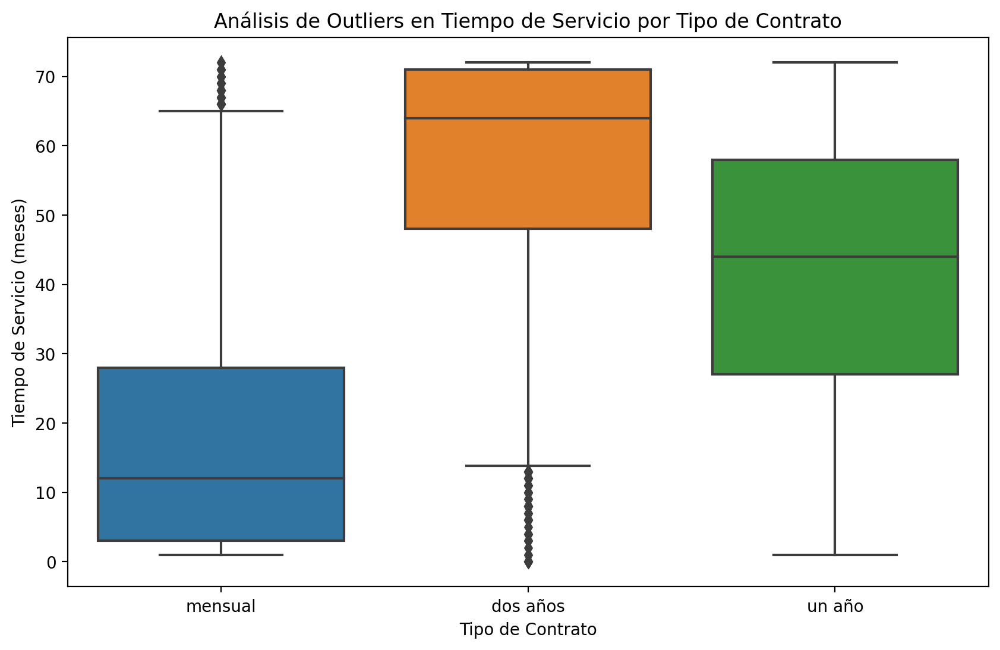

In [728]:
def boxplot(df):
    # Graficar boxplots para detectar outliers en cada tipo de contrato
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x='cuenta.contrato', y='cliente.tiempo_servicio')


    # Personalizar el gráfico
    plt.title('Análisis de Outliers en Tiempo de Servicio por Tipo de Contrato')
    plt.xlabel('Tipo de Contrato')
    plt.ylabel('Tiempo de Servicio (meses)')

    # Mostrar el gráfico
    plt.show()
boxplot(datos_churn)

##**2.3 Normalizacion de datos**

In [729]:
for col in datos_churn.columns:
    print(f"Columna: {col}")
    print(datos_churn[col].unique())
    print("-" * 30)

Columna: id_cliente
['0003-MKNFE' '0004-TLHLJ' '0011-IGKFF' ... '9992-UJOEL' '9993-LHIEB'
 '9995-HOTOH']
------------------------------
Columna: Churn
['no' 'si']
------------------------------
Columna: cliente.genero
['masculino' 'femenino']
------------------------------
Columna: cliente.anciano
[0 1]
------------------------------
Columna: cliente.pareja
['no' 'si']
------------------------------
Columna: cliente.dependientes
['no' 'si']
------------------------------
Columna: cliente.tiempo_servicio
[ 9.          4.         13.          3.         71.         63.
  7.         65.86954118 54.         72.          5.         56.
 34.          1.         45.         50.         23.         55.
 26.         69.         37.         49.         66.         67.
 20.         43.         59.         12.         27.          2.
 25.         29.         14.         35.         64.         39.
 40.         11.          6.         30.         70.         57.
 58.         16.         32.        

In [730]:
y = datos_churn["Churn"]
X= datos_churn.iloc[:, 2:]

<Axes: xlabel='Churn', ylabel='count'>

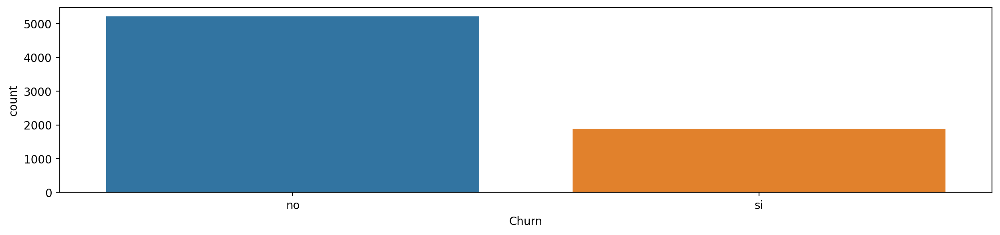

In [731]:
sns.countplot(x=y) # Base desbalanceada hacía el no

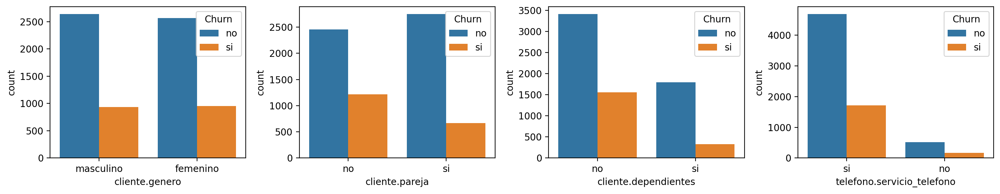

In [732]:
plt.rcParams["figure.figsize"] = (15,3)
plt.rcParams["figure.dpi"] = 200
fig, ax = plt.subplots(1,4)


sns.countplot(x='cliente.genero', data = X, ax = ax[0], hue = y) #Al parecer no hay una inclinación para el churn en el sexo
sns.countplot(x='cliente.pareja', data = X, ax = ax[1], hue = y)# Los que tienen parejas tienden más al churn que los que no tienen
sns.countplot(x='cliente.dependientes', data = X, ax = ax[2], hue = y)# Clientes no dependientes tienen más inclinación al churn
sns.countplot(x='telefono.servicio_telefono', data = X, ax = ax[3], hue = y)# Tener varios servicios de telefono puede afectar al churn

plt.tight_layout()

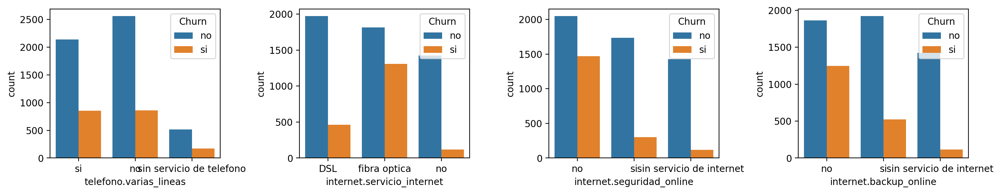

In [733]:
plt.rcParams["figure.figsize"] = (15,3)
plt.rcParams["figure.dpi"] = 200
fig, ax = plt.subplots(1,4)
sns.countplot(x='telefono.varias_lineas', data = X, ax = ax[0], hue = y)
sns.countplot(x='internet.servicio_internet', data = X, ax = ax[1], hue = y)#La fibra optica puede tener una alta incidencia
sns.countplot(x='internet.seguridad_online', data = X, ax = ax[2], hue = y)#Los que no tienen seguridad online tienen alto churn
sns.countplot(x='internet.backup_online', data = X, ax = ax[3], hue = y)#Los que no tienen backup_online tienen mayor probabilidad de churn
plt.tight_layout()

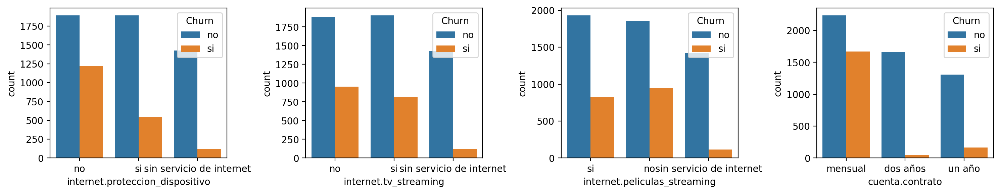

In [734]:
plt.rcParams["figure.figsize"] = (15,3)
plt.rcParams["figure.dpi"] = 200
fig, ax = plt.subplots(1,4)
sns.countplot(x='internet.proteccion_dispositivo', data = X, ax = ax[0], hue = y)#Los que no tiene protección de dispositivos tienen más prob de churn
sns.countplot(x='internet.tv_streaming', data = X, ax = ax[1], hue = y)#Sin servicio de internet parece no tener relevancia en el churn 
sns.countplot(x='internet.peliculas_streaming', data = X, ax = ax[2], hue = y)#Sin servicio de internet parece no tener relevancia en el churn 
sns.countplot(x='cuenta.contrato', data = X, ax = ax[3], hue = y)#Cuentas de más de dos años tiene poco churn, pero las que tienen contrato mensual tienen alto churn.
plt.tight_layout()

<Axes: xlabel='cuenta.metodo_pago', ylabel='count'>

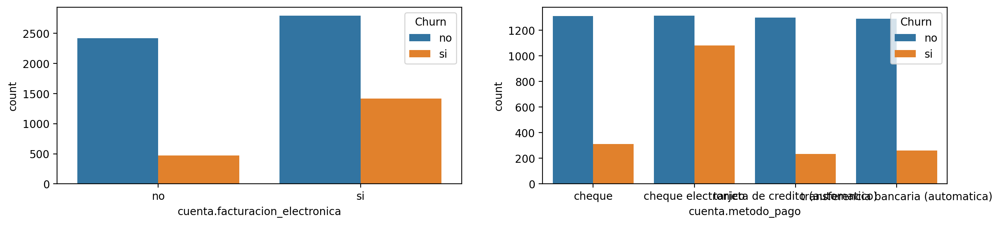

In [735]:
plt.rcParams["figure.figsize"] = (15,3)
plt.rcParams["figure.dpi"] = 200
fig, ax = plt.subplots(1,2)
sns.countplot(x='cuenta.facturacion_electronica', data = X, ax = ax[0], hue = y)# La facturación electrónica tiene mayor probabilidad de churn.
sns.countplot(x='cuenta.metodo_pago', data = X, ax = ax[1], hue = y)#Cheque electronico tiene alto churn en comparación a las otras 3 opciones.


C:\Users\palma\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



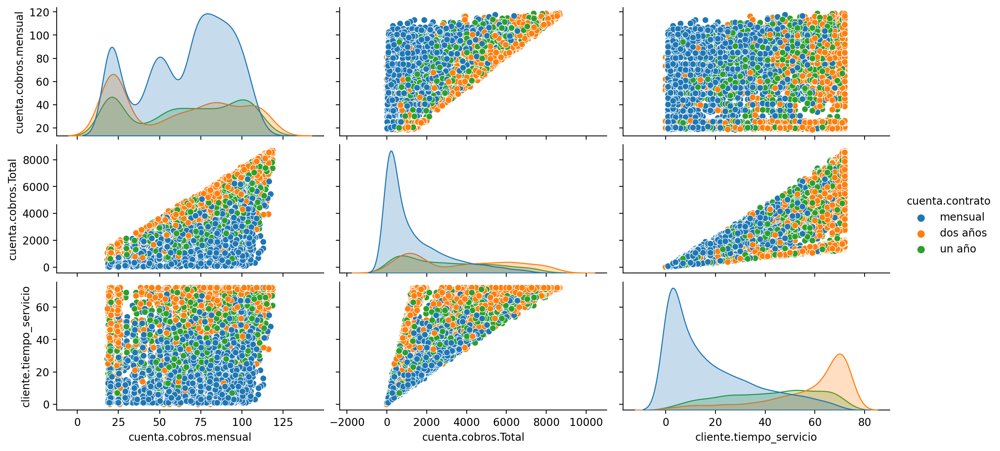

In [736]:
sns.pairplot(datos_churn, vars=['cuenta.cobros.mensual', 'cuenta.cobros.Total' ,'cliente.tiempo_servicio'], height=2, aspect=2, hue ='cuenta.contrato')


C:\Users\palma\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



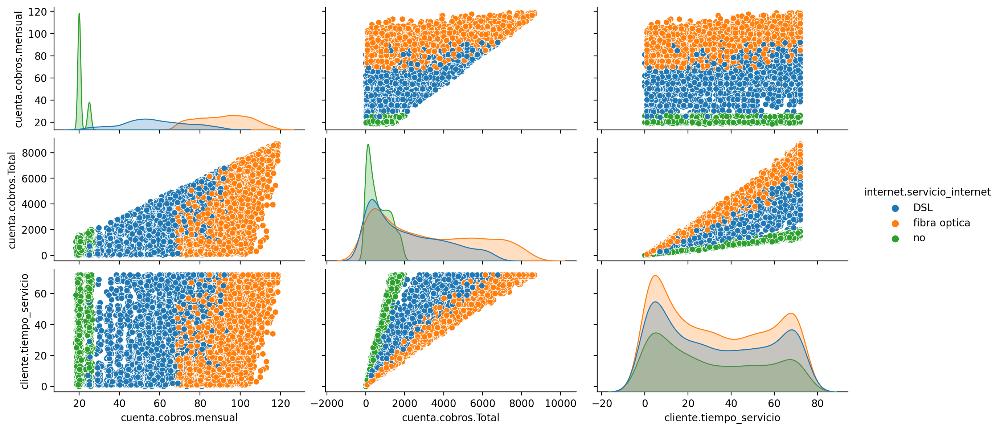

In [737]:
sns.pairplot(datos_churn, vars=['cuenta.cobros.mensual', 'cuenta.cobros.Total' ,'cliente.tiempo_servicio'], height=2, aspect=2, hue ='internet.servicio_internet')
#En esta variable se podría utilizar un ordinal encoder ya que se ve claramente que el orden es no-DSL-fibra optica

C:\Users\palma\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



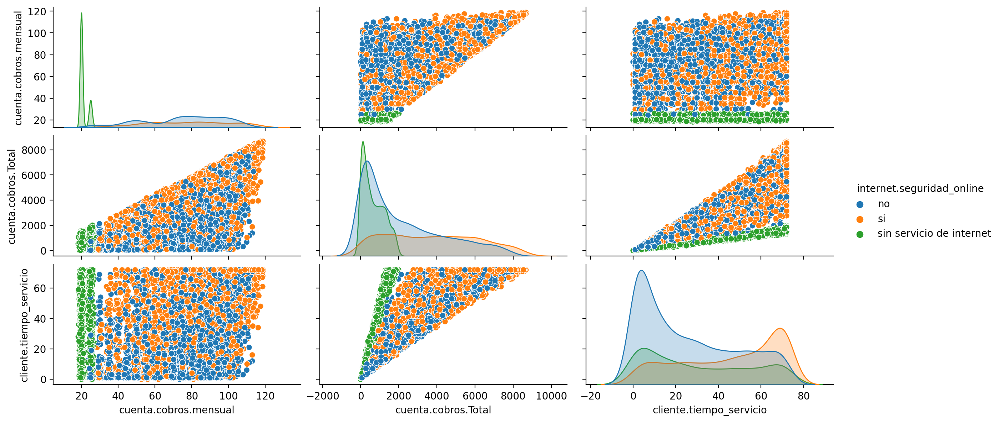

In [738]:
sns.pairplot(datos_churn, vars=['cuenta.cobros.mensual', 'cuenta.cobros.Total' ,'cliente.tiempo_servicio'], height=2, aspect=2, hue ='internet.seguridad_online')
#sin servicio de internet parece no aportar en general

In [739]:
datos_churn[["cliente.tiempo_servicio","cuenta.cobros.mensual","cuenta.cobros.Total"]].describe()

,cliente.tiempo_servicio,cuenta.cobros.mensual,cuenta.cobros.Total
count,7096.000000,7096.000000,7096.000000
mean,32.360127,64.746970,2278.233822
std,24.562393,30.101788,2267.284798
min,0.000000,18.250000,0.000000
25%,9.000000,35.450000,394.662500
50%,29.000000,70.350000,1390.225000
75%,55.000000,89.862500,3779.737500
max,72.000000,118.750000,8684.800000


<Axes: ylabel='Frequency'>

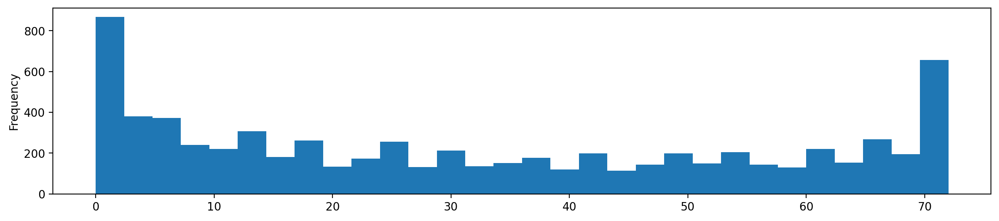

In [740]:
#Se crearán rangos de valores bajo-medio-alto
datos_churn["cliente.tiempo_servicio"].plot(kind="hist", bins =30)


<Axes: ylabel='Frequency'>

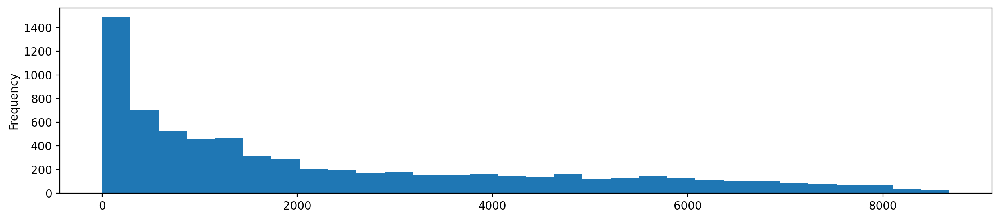

In [741]:
datos_churn['cuenta.cobros.Total'].plot(kind="hist", bins =30)
#Podemos probar aplicando una transformación logaritmica o una transformación box-cox


<Axes: ylabel='Frequency'>

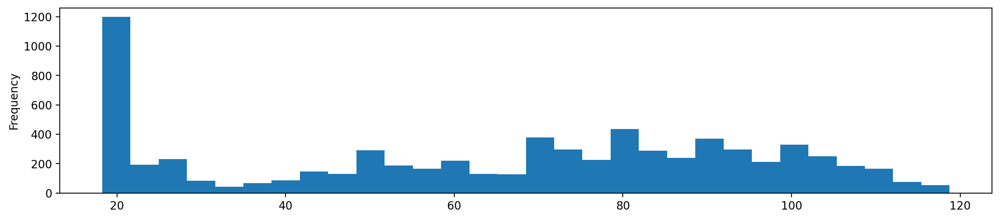

In [742]:
datos_churn['cuenta.cobros.mensual'].plot(kind="hist", bins =30)

In [743]:
def agrupar_variable(variable):
    # Crear un histograma para visualizar la distribución de la variable original
    plt.hist(datos_churn[variable])

    # Etiquetas de los ejes y título del gráfico
    plt.xlabel(f"{variable.title()}")
    plt.ylabel("Conteo")
    plt.title(f"Distribución de {variable.title()}")
    plt.show()

    # Crear los "bins" (rangos) usando np.linspace, dividiendo la variable en 3 grupos
    bins = np.linspace(min(datos_churn[variable]), max(datos_churn[variable]), 4)
    
    # Imprimir los rangos de valores para los "bins"
    print("**Rango de Valores**")
    print(f"Bajo ({bins[0] : .2f} - {bins[1]: .2f})")
    print(f"Medio ({bins[1]: .2f} - {bins[2]: .2f})")
    print(f"Alto ({bins[2]: .2f} - {bins[3]: .2f})")

    # Nombres de los grupos categóricos
    nombres_grupos = ['Bajo', 'Medio', 'Alto']

    # Aplicar el binning a la variable y crear una nueva columna en el DataFrame
    datos_churn.insert(datos_churn.shape[1]-1, f'{variable}-agrupada', 
                       pd.cut(datos_churn[variable], bins, labels=nombres_grupos, include_lowest=True))

    # Mostrar los primeros 10 valores de la variable original y su nueva columna categorizada
    display(datos_churn[[variable, f'{variable}-agrupada']].head(10))

    # Mostrar la distribución de valores en los grupos categóricos
    print("<br>**Distribución por Categorías**<br>")
    display(datos_churn[f'{variable}-agrupada'].value_counts())

    # Crear un gráfico de barras para mostrar la distribución de los "bins"
    plt.bar(nombres_grupos, datos_churn[f'{variable}-agrupada'].value_counts())

    # Etiquetas de los ejes y título del gráfico de barras
    plt.xlabel(f"{variable.title()}")
    plt.ylabel("Conteo")
    plt.title(f"Distribución de {variable.title()} por Categorías")
    plt.show()

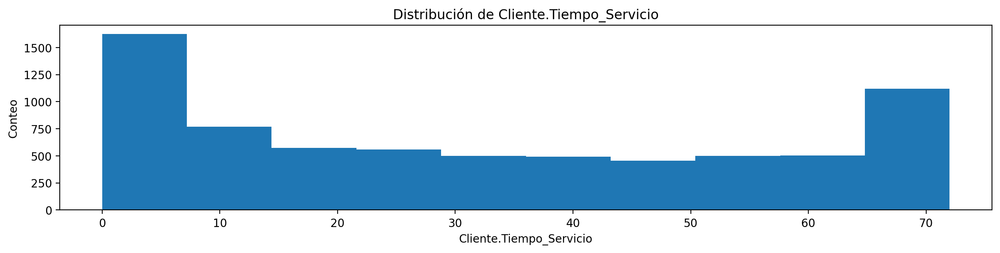

**Rango de Valores**
Bajo ( 0.00 -  24.00)
Medio ( 24.00 -  48.00)
Alto ( 48.00 -  72.00)


,cliente.tiempo_servicio,cliente.tiempo_servicio-agrupada
0,9.000000,Bajo
1,4.000000,Bajo
2,13.000000,Bajo
3,3.000000,Bajo
4,9.000000,Bajo
5,71.000000,Alto
6,63.000000,Alto
7,7.000000,Bajo
8,65.869541,Alto
9,54.000000,Alto


<br>**Distribución por Categorías**<br>


cliente.tiempo_servicio-agrupada
Bajo     3236
Alto     2256
Medio    1604
Name: count, dtype: int64

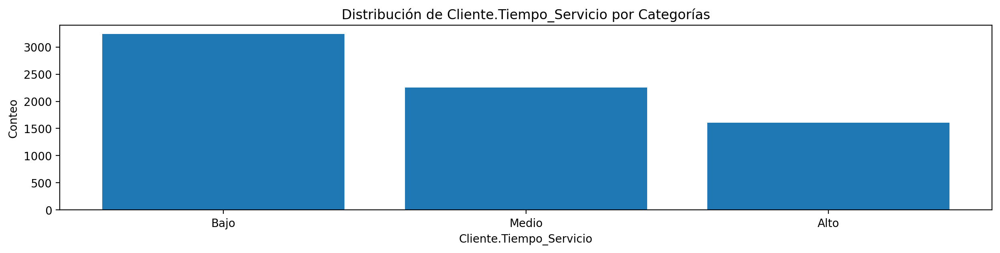

In [744]:
agrupar_variable('cliente.tiempo_servicio')

In [745]:
from scipy import stats
#Aplicamos transformación boxcox
datos_churn['cuenta.cobros.Total'], _ = stats.boxcox(datos_churn['cuenta.cobros.Total'] + 1)

In [746]:
#También puede aplicarse transformación logarítmica 
#datos_churn['cuenta.cobros.Total'] = np.log1p(datos_churn['cuenta.cobros.Total'])

In [747]:
grouped_facturacion = datos_churn.groupby('cuenta.metodo_pago')['cuenta.facturacion_electronica'].count()
print(grouped_facturacion)

cuenta.metodo_pago
cheque                                 1622
cheque electronico                     2392
tarjeta de credito (automatico)        1532
transferencia bancaria (automatica)    1550
Name: cuenta.facturacion_electronica, dtype: int64


C:\Users\palma\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



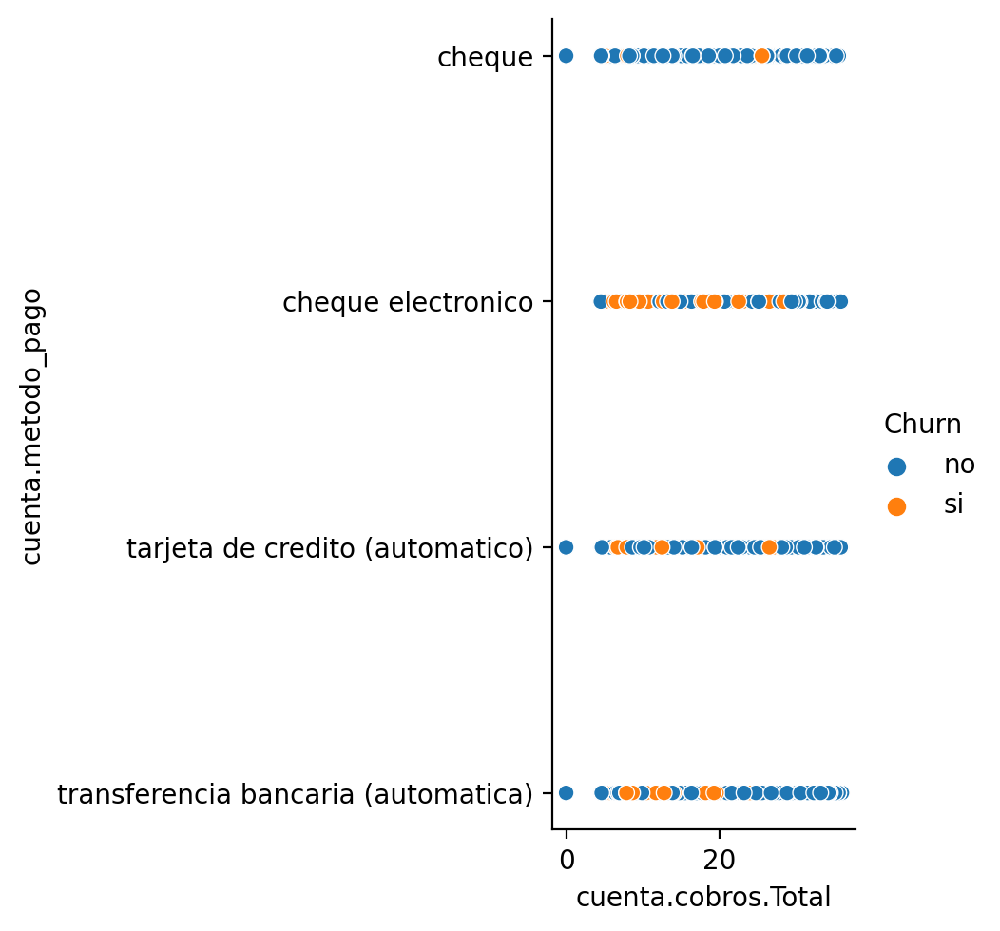

In [748]:
sns.relplot(x='cuenta.cobros.Total' ,y="cuenta.metodo_pago", hue="Churn", data=datos_churn)


C:\Users\palma\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



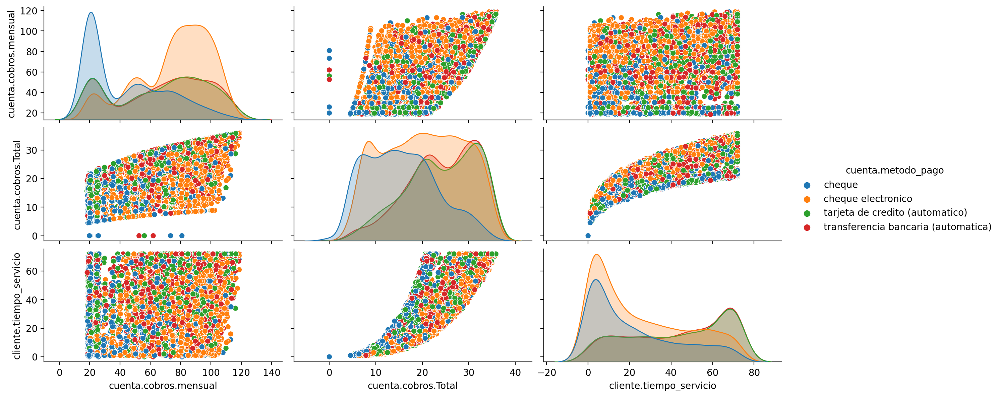

In [749]:
sns.pairplot(datos_churn, vars=['cuenta.cobros.mensual', 'cuenta.cobros.Total' ,'cliente.tiempo_servicio'], height=2, aspect=2, hue ="cuenta.metodo_pago")


In [750]:
def normalizacion():
    global datos_churn
    
     # 1. Eliminación de la columna `id_cliente`
    if 'id_cliente' in datos_churn.columns:
        datos_churn = datos_churn.drop('id_cliente', axis=1)
    # 2. Reemplazar las variables binarias por 1 ó 0
    datos_churn['Churn']= np.where(datos_churn['Churn']=="si",1,0)
    datos_churn['cliente.pareja']= np.where(datos_churn['cliente.pareja']=="si",1,0)
    datos_churn['cliente.dependientes']= np.where(datos_churn['cliente.dependientes']=="si",1,0)
    datos_churn['telefono.servicio_telefono']= np.where(datos_churn['telefono.servicio_telefono']=="si",1,0)
    datos_churn['cuenta.facturacion_electronica']= np.where(datos_churn['cuenta.facturacion_electronica']=="si",1,0)
    datos_churn['cliente.genero']= np.where(datos_churn['cliente.genero']=='femenino',1,0)
    #Aplico ordinal encoder para la variable metodo de pago
    metodo_pago = {"transferencia bancaria (automatica)":1, "tarjeta de credito (automatico)":1, "cheque electronico":2, "cheque":0}
    datos_churn["cuenta.metodo_pago"] =datos_churn["cuenta.metodo_pago"].map(metodo_pago)
    #Aplico ordinal encoder para la variable servicio de internet
    serv_int = {"no":0, "DSL":1, "fibra optica":2}
    datos_churn["internet.servicio_internet"] =datos_churn["internet.servicio_internet"].map(serv_int)
    # 3. Creación de variables dummy para las columnas restantes
    datos_churn = pd.get_dummies(datos_churn)

    # 4. Convertir columnas de tipo booleano a 0 y 1
    bool_columns = datos_churn.select_dtypes(include='bool').columns
    datos_churn[bool_columns] = datos_churn[bool_columns].astype(int)

    # 5. Reiniciar el índice del DataFrame para eliminar el índice anterior
    datos_churn.reset_index(drop=True, inplace=True)
    
    
    return datos_churn

In [751]:
datos_churn.head()

,id_cliente,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cliente.tiempo_servicio-agrupada,cuenta.cobros.Total
0,0003-MKNFE,no,masculino,0,no,no,9.0,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,59.9,Bajo,15.703579
1,0004-TLHLJ,si,masculino,0,no,no,4.0,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,73.9,Bajo,12.666821
2,0011-IGKFF,si,masculino,1,si,no,13.0,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,98.0,Bajo,20.315610
3,0013-EXCHZ,si,femenino,1,si,no,3.0,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,83.9,Bajo,12.460429
4,0013-MHZWF,no,femenino,0,no,si,9.0,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),69.4,Bajo,15.967091


In [752]:
normalizacion()
datos_churn.head()

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,internet.servicio_internet,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total,telefono.varias_lineas_no,telefono.varias_lineas_si,telefono.varias_lineas_sin servicio de telefono,internet.seguridad_online_no,internet.seguridad_online_si,internet.seguridad_online_sin servicio de internet,internet.backup_online_no,internet.backup_online_si,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_no,internet.proteccion_dispositivo_si,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_no,internet.soporte_tecnico_si,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_no,internet.tv_streaming_si,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_no,internet.peliculas_streaming_si,internet.peliculas_streaming_sin servicio de internet,cuenta.contrato_dos años,cuenta.contrato_mensual,cuenta.contrato_un año,cliente.tiempo_servicio-agrupada_Bajo,cliente.tiempo_servicio-agrupada_Medio,cliente.tiempo_servicio-agrupada_Alto
0,0,0,0,0,0,9.0,1,1,0,0,59.9,15.703579,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,1,0,0
1,1,0,0,0,0,4.0,1,2,1,2,73.9,12.666821,1,0,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,1,0,0
2,1,0,1,1,0,13.0,1,2,1,2,98.0,20.315610,1,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,1,0,0
3,1,1,1,1,0,3.0,1,2,1,0,83.9,12.460429,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,0
4,0,1,0,0,1,9.0,1,1,1,1,69.4,15.967091,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0


In [753]:
datos_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7096 entries, 0 to 7095
Data columns (total 39 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Churn                                                     7096 non-null   int32  
 1   cliente.genero                                            7096 non-null   int32  
 2   cliente.anciano                                           7096 non-null   int64  
 3   cliente.pareja                                            7096 non-null   int32  
 4   cliente.dependientes                                      7096 non-null   int32  
 5   cliente.tiempo_servicio                                   7096 non-null   float64
 6   telefono.servicio_telefono                                7096 non-null   int32  
 7   internet.servicio_internet                                7096 non-null   int64  
 8   cuenta.facturacion

#**3. Modelo Random Forest**


---


In [754]:
y = datos_churn['Churn']
x = datos_churn.drop(columns='Churn')
train_x, test_x, train_y, test_y = train_test_split(x, y, test_size=0.3, random_state = 50)

In [755]:
def pronosticar(train_x, train_y):
  model = RandomForestClassifier(random_state=50)
  model.fit(train_x, train_y)
  return model

In [756]:
model = pronosticar(train_x, train_y)
model.score(test_x, test_y)

0.7923907937999061

#**4. Reducción de Dimensionalidad**


---


##**4.1 Métodos Gráficos**

In [757]:
def diagrama_violin(df, inicio, fin):
    # Asegurar que Churn siempre esté en el DataFrame
    y = df["Churn"]
    # Seleccionar solo las columnas de tipo int64
    x = df.select_dtypes(include=["int32"]).iloc[:, inicio:fin]
    
    # Concatenar la columna Churn con las columnas seleccionadas
    df_filtered = pd.concat([y, x], axis=1)
    
    # Convertir el DataFrame a formato largo (long format)
    df_melted = pd.melt(df_filtered, id_vars="Churn", var_name="features", value_name="valores")

    plt.figure(figsize=(12, 6))
    
    # Crear el diagrama de violín, diferenciando por la columna Churn y usando la paleta azul-naranja
    sns.violinplot(x="features", y="valores", hue="Churn", data=df_melted, split=True,palette="deep")

    plt.xticks(rotation=90)  # Rotar etiquetas del eje X
    plt.title("Diagrama de Violín: Comparación de Características vs Churn")
    plt.ylabel("Valores")
    plt.grid(True)

    # Mostrar el gráfico
    plt.show()
def diagrama_puntos(df, inicio, fin):
    # Asegura que Churn siempre esté en el dataframe
    y = df["Churn"]
    # Seleccionar solo las columnas de tipo int32 y excluir la columna Churn
    x = df.select_dtypes(include=["int"]).drop(columns="Churn")
    
    # Filtrar las columnas seleccionadas
    df_filtered = pd.concat([y.reset_index(drop=True), x.iloc[:, inicio:fin]], axis=1)  # Concatenar la columna Churn

    # Convertir el DataFrame a formato largo
    df_melted = pd.melt(df_filtered, id_vars="Churn", var_name="features", value_name="valores")

    plt.figure(figsize=(12, 6))
    
    # Crear un diagrama de puntos
    sns.pointplot(x="features", y="valores", hue="Churn", data=df_melted, palette="deep", markers=["o", "s"])
    
    plt.xticks(rotation=90)  # Rotar etiquetas del eje X
    plt.title("Diagrama de Puntos: Comparación de Características vs Churn (int64)")
    plt.xlabel("Características")
    plt.ylabel("Valores")
    plt.grid(True)

    # Mostrar el gráfico
    plt.show()

def mapa_calor(df):
    #Tu código aquí
    plt.figure(figsize=(16,14))
    sns.heatmap(df.corr(), annot=True, fmt=".1f")
    return df.corr()

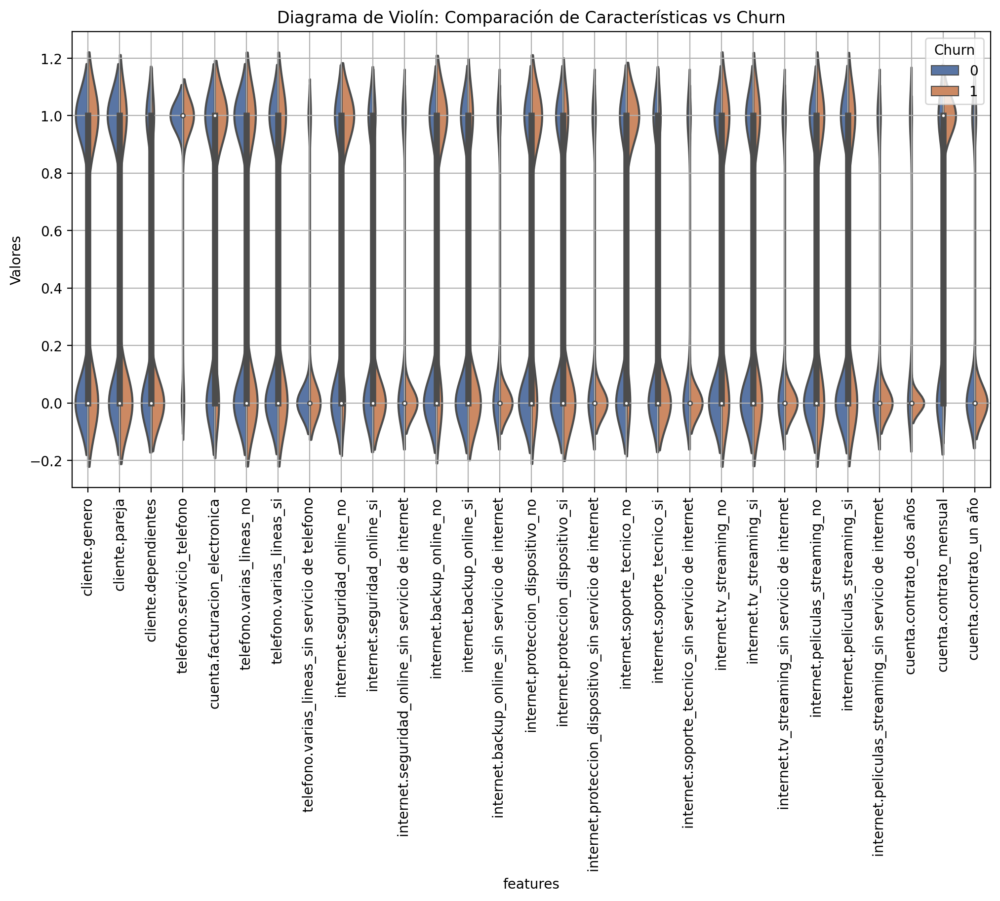

In [758]:
diagrama_violin(datos_churn, 1, 30)

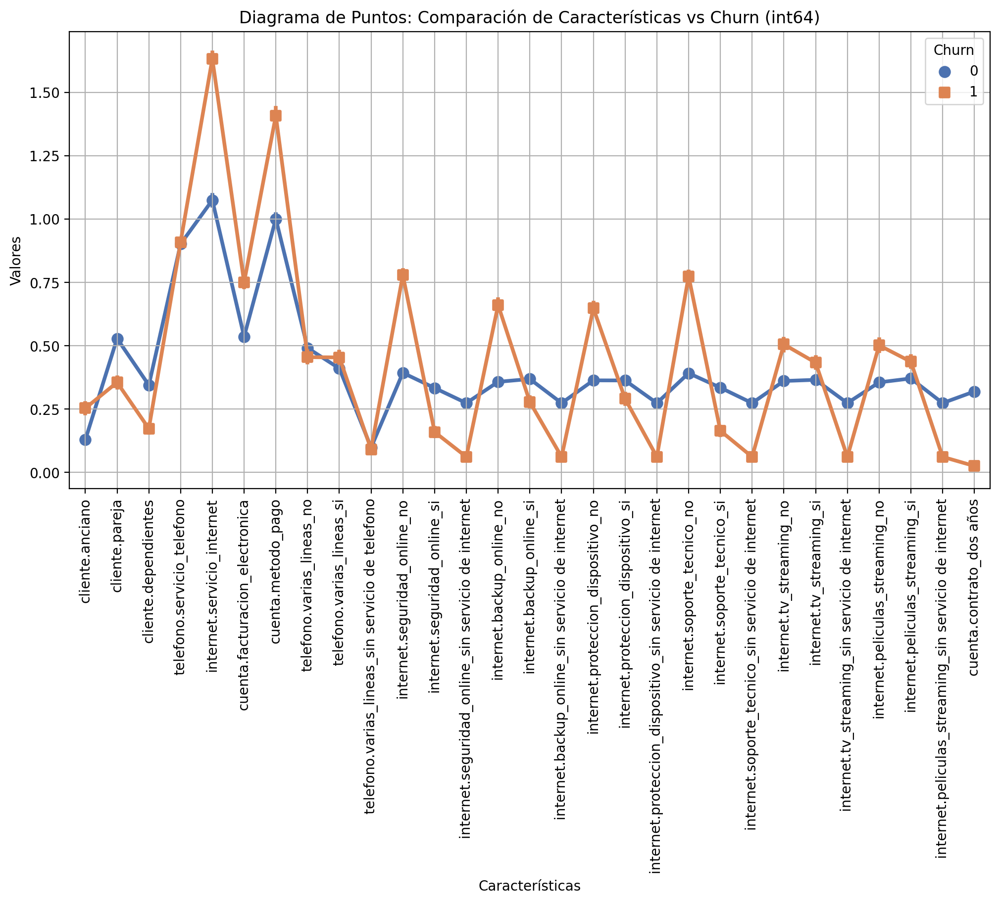

In [759]:
diagrama_puntos(datos_churn, 1, 30)

In [760]:
datos_churn.groupby('Churn')["telefono.varias_lineas_sin servicio de telefono"].value_counts(normalize=True)

Churn  telefono.varias_lineas_sin servicio de telefono
0      0                                                  0.901344
       1                                                  0.098656
1      0                                                  0.908802
       1                                                  0.091198
Name: proportion, dtype: float64

In [761]:
train_x = train_x.drop(columns=["telefono.varias_lineas_sin servicio de telefono"])
test_x = test_x.drop(columns=["telefono.varias_lineas_sin servicio de telefono"])
model = pronosticar(train_x, train_y)
model.score(test_x, test_y)

0.8022545796148427

##**4.2 Mapa de Calor**

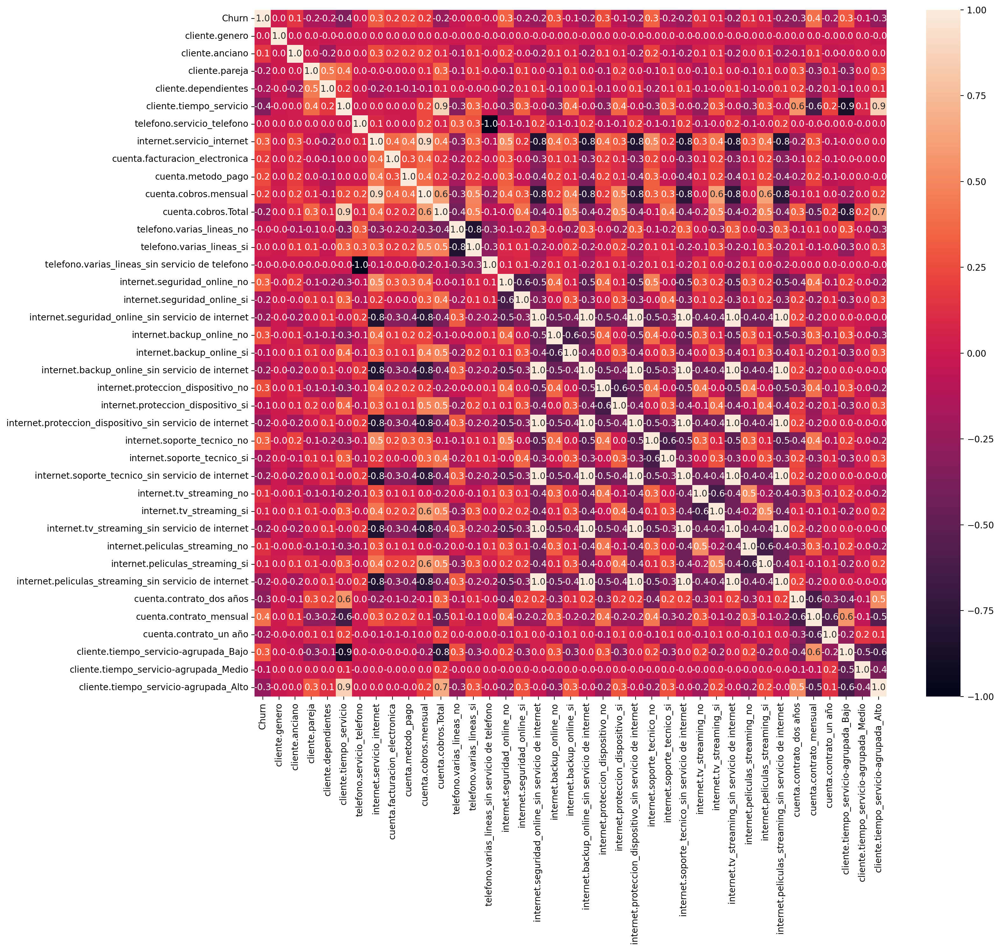

In [762]:
matriz = mapa_calor(datos_churn)

In [763]:
matriz2 = matriz>0.99
matriz2 = matriz2.sum()
matriz2[matriz2>1]

internet.seguridad_online_sin servicio de internet          6
internet.backup_online_sin servicio de internet             6
internet.proteccion_dispositivo_sin servicio de internet    6
internet.soporte_tecnico_sin servicio de internet           6
internet.tv_streaming_sin servicio de internet              6
internet.peliculas_streaming_sin servicio de internet       6
dtype: int64

In [764]:
def identificar_variables(base):
    columnas = base.index.tolist()

    # Identificar las columnas que están altamente correlacionadas
    df = datos_churn[columnas]

    return df

In [765]:
identificar_variables(matriz2[matriz2>1])

,internet.seguridad_online_sin servicio de internet,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_sin servicio de internet
0,0,0,0,0,0,0
1,0,0,0,0,0,0
2,0,0,0,0,0,0
3,0,0,0,0,0,0
4,0,0,0,0,0,0
...,...,...,...,...,...,...
7091,0,0,0,0,0,0
7092,0,0,0,0,0,0
7093,1,1,1,1,1,1
7094,0,0,0,0,0,0


In [766]:
train_x = train_x.drop(columns=[ 'internet.seguridad_online_sin servicio de internet', 'internet.backup_online_sin servicio de internet', 'internet.tv_streaming_sin servicio de internet', 'internet.soporte_tecnico_sin servicio de internet', 'internet.proteccion_dispositivo_sin servicio de internet'])
test_x = test_x.drop(columns=['internet.seguridad_online_sin servicio de internet', 'internet.backup_online_sin servicio de internet', 'internet.tv_streaming_sin servicio de internet', 'internet.soporte_tecnico_sin servicio de internet', 'internet.proteccion_dispositivo_sin servicio de internet'])
model = pronosticar(train_x, train_y)
model.score(test_x, test_y)

0.8041333959605449

##**4.3 Feature Importances**

In [767]:
def pronosticar_kbest(train_x, test_x, train_y, test_y):
    mejor_k = 0
    mejor_score = 0
    mejores_columnas = []

    # Iterar sobre el rango de posibles valores de k (número de características)
    for k in range(1, train_x.shape[1] + 1):
        seleccionar_mejores = SelectKBest(chi2, k=k)
        seleccionar_mejores.fit(train_x, train_y)
        train_x_kbest = seleccionar_mejores.transform(train_x)

        model = RandomForestClassifier(random_state=50)
        
        # Validación cruzada
        scores = cross_val_score(model, train_x_kbest, train_y, cv=5, scoring='accuracy')
        score = np.mean(scores)
        
        # Verificar si se ha alcanzado una mejor precisión
        if score > mejor_score:
            mejor_k = k
            mejor_score = score
            mejor_seleccionador = seleccionar_mejores
            mejores_columnas = train_x.columns[seleccionar_mejores.get_support()]  # Nombres de columnas

    # Ajustar el modelo con las mejores características
    mejor_model = RandomForestClassifier(random_state=50)
    train_x_kbest = mejor_seleccionador.transform(train_x)
    test_x_kbest = mejor_seleccionador.transform(test_x)
    mejor_model.fit(train_x_kbest, train_y)
    print(f"Utilizando SelectKBest:")
    print(f"El mejor número de características seleccionadas es {mejor_k} con un score de {mejor_score:.4f}")
    print(f"Las columnas más importantes son: {mejores_columnas}")

    # Devolver las variables solicitadas
    

In [768]:
pronosticar_kbest(train_x, test_x, train_y, test_y)


Utilizando SelectKBest:
El mejor número de características seleccionadas es 23 con un score de 0.7957
Las columnas más importantes son: Index(['cliente.anciano', 'cliente.pareja', 'cliente.dependientes',
       'cliente.tiempo_servicio', 'internet.servicio_internet',
       'cuenta.facturacion_electronica', 'cuenta.metodo_pago',
       'cuenta.cobros.mensual', 'cuenta.cobros.Total',
       'internet.seguridad_online_no', 'internet.seguridad_online_si',
       'internet.backup_online_no', 'internet.proteccion_dispositivo_no',
       'internet.soporte_tecnico_no', 'internet.soporte_tecnico_si',
       'internet.tv_streaming_no', 'internet.peliculas_streaming_no',
       'internet.peliculas_streaming_sin servicio de internet',
       'cuenta.contrato_dos años', 'cuenta.contrato_mensual',
       'cuenta.contrato_un año', 'cliente.tiempo_servicio-agrupada_Bajo',
       'cliente.tiempo_servicio-agrupada_Alto'],
      dtype='object')


In [356]:
def pronosticar_RFE(train_x, test_x, train_y, test_y):
    model = RandomForestClassifier(random_state=50)
    mejor_n = 0
    mejor_score = 0
    mejores_columnas = []

    # Probar diferentes números de características
    for n in range(1, train_x.shape[1] + 1):
        rfe = RFE(estimator=model, n_features_to_select=n)
        rfe.fit(train_x, train_y)
        train_x_rfe = rfe.transform(train_x)

        # Evaluar el modelo con validación cruzada
        scores = cross_val_score(model, train_x_rfe, train_y, scoring='accuracy')
        score = scores.mean()

        # Verificar si el score es mejor que el anterior
        if score > mejor_score:
            mejor_n = n
            mejor_score = score
            mejor_rfe = rfe
            mejores_columnas = list(train_x.columns[rfe.support_])

    # Entrenar el modelo con las mejores características seleccionadas
    mejor_model = RandomForestClassifier(random_state=50)
    train_x_rfe = mejor_rfe.transform(train_x)
    test_x_rfe = mejor_rfe.transform(test_x)
    mejor_model.fit(train_x_rfe, train_y)
    

    print(f"Utilizando RFE:")
    print(f"El mejor número de características seleccionadas es {mejor_n} con un score de {mejor_score:.4f}")
    print(f"Las columnas más importantes son: {mejores_columnas}")

In [357]:
pronosticar_RFE(train_x, test_x, train_y, test_y)


Utilizando RFE:
El mejor número de características seleccionadas es 11 con un score de 0.7979
Las columnas más importantes son: ['cliente.genero', 'cliente.tiempo_servicio', 'internet.servicio_internet', 'cuenta.facturacion_electronica', 'cuenta.metodo_pago', 'cuenta.cobros.mensual', 'cuenta.cobros.Total', 'internet.seguridad_online_no', 'internet.backup_online_no', 'internet.soporte_tecnico_no', 'cuenta.contrato_mensual']


In [769]:
def pronosticar_RFECV(train_x, test_x, train_y, test_y):
    model = RandomForestClassifier(random_state=50)
    mejor_n = 0
    mejor_score = 0
    mejores_columnas = []

    # Probar diferentes números de características
    for n in range(1, train_x.shape[1] + 1):
        rfe = RFE(estimator=model, n_features_to_select=n)
        rfe.fit(train_x, train_y)
        train_x_rfe = rfe.transform(train_x)

        # Evaluar el modelo con validación cruzada
        scores = cross_val_score(model, train_x_rfe, train_y, cv=5, scoring='accuracy')
        score = scores.mean()

        # Verificar si el score es mejor que el anterior
        if score > mejor_score:
            mejor_n = n
            mejor_score = score
            mejor_rfe = rfe
            mejores_columnas = list(train_x.columns[rfe.support_])

    # Entrenar el modelo con las mejores características seleccionadas
    mejor_model = RandomForestClassifier(random_state=50)
    train_x_rfe = mejor_rfe.transform(train_x)
    test_x_rfe = mejor_rfe.transform(test_x)
    mejor_model.fit(train_x_rfe, train_y)
    print(f"Utilizando RFE:")
    print(f"El mejor número de características seleccionadas es {mejor_n} con un score de {mejor_score:.4f}")
    print(f"Las columnas más importantes son: {mejores_columnas}")

In [770]:
pronosticar_RFECV(train_x, test_x, train_y, test_y)


Utilizando RFE:
El mejor número de características seleccionadas es 12 con un score de 0.7969
Las columnas más importantes son: ['cliente.genero', 'cliente.tiempo_servicio', 'internet.servicio_internet', 'cuenta.facturacion_electronica', 'cuenta.metodo_pago', 'cuenta.cobros.mensual', 'cuenta.cobros.Total', 'internet.seguridad_online_no', 'internet.backup_online_no', 'internet.soporte_tecnico_no', 'cuenta.contrato_mensual', 'cliente.tiempo_servicio-agrupada_Bajo']


In [771]:
def pronosticar_PCA(train_x, test_x, train_y, test_y):
    n = 9
    pca = PCA(n_components=n)

    # Ajustar y transformar los datos con PCA
    train_x_pca = pca.fit_transform(train_x)
    model = RandomForestClassifier(random_state=50)
    model.fit(train_x_pca, train_y)
    test_x_pca = pca.transform(test_x)

    # Imprimir resultados de PCA
    print("Utilizando PCA:")
    print(f"El número de características seleccionadas es {n} con un score de {model.score(test_x_pca, test_y) * 100:.2f}%")

    # Calcular y mostrar el total de varianza explicada
    total_varianza_explicada = sum(pca.explained_variance_ratio_)
    print(f"Total de varianza explicada por el PCA: {total_varianza_explicada * 100:.2f}%")

    # Visualizar el explained variance ratio
    plt.figure(figsize=(10, 6))
    plt.bar(range(1, n + 1), pca.explained_variance_ratio_, alpha=0.7, color='blue')
    plt.ylabel('Explained Variance Ratio')
    plt.xlabel('Componentes Principales')
    plt.title('Proporción de Varianza Explicada por Componente Principal')
    plt.xticks(np.arange(1, n + 1, 1))
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    # Obtener las cargas de los componentes
    loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
    component_names = [f'PC{i+1}' for i in range(n)]
    loadings_df = pd.DataFrame(loadings, index=train_x.columns, columns=component_names)

    # Imprimir las cargas de los componentes
    print("Cargas de los Componentes:")
    print(loadings_df.round(3))

In [772]:
from sklearn.preprocessing import StandardScaler
#PCA es sensible a datos no escalados
scaler = StandardScaler()
train_x_scaled = pd.DataFrame(scaler.fit_transform(train_x), columns=train_x.columns)
test_x_scaled = pd.DataFrame(scaler.transform(test_x), columns=test_x.columns)

Utilizando PCA:
El número de características seleccionadas es 9 con un score de 79.94%
Total de varianza explicada por el PCA: 71.72%


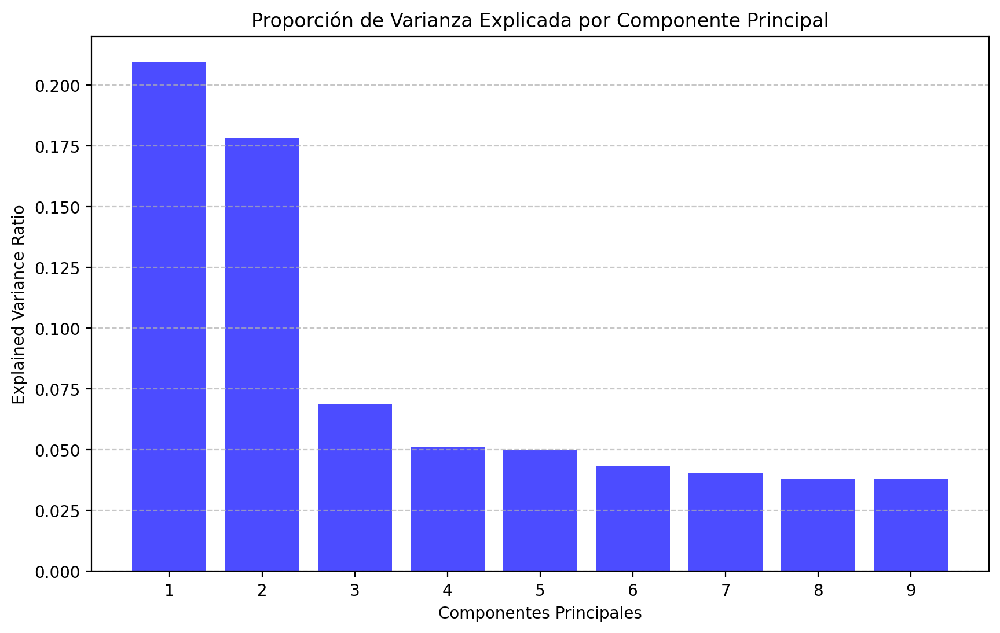

Cargas de los Componentes:
                                                      PC1    PC2    PC3  \
cliente.genero                                     -0.006  0.001 -0.022   
cliente.anciano                                     0.066  0.320 -0.150   
cliente.pareja                                      0.406 -0.153  0.101   
cliente.dependientes                                0.168 -0.291  0.143   
cliente.tiempo_servicio                             0.864 -0.231  0.134   
telefono.servicio_telefono                          0.021 -0.028 -0.304   
internet.servicio_internet                          0.283  0.881  0.012   
cuenta.facturacion_electronica                      0.116  0.428 -0.159   
cuenta.metodo_pago                                  0.106  0.506 -0.182   
cuenta.cobros.mensual                               0.570  0.729 -0.122   
cuenta.cobros.Total                                 0.918  0.152  0.080   
telefono.varias_lineas_no                          -0.470 -0.304 -0.024  

In [773]:
pronosticar_PCA(train_x_scaled, test_x_scaled, train_y, test_y)

In [774]:
# Definir el modelo
rf = RandomForestClassifier(random_state=50)

# Definir los hiperparámetros para GridSearch
param_grid = {
    'n_estimators': [100, 200, 300],           # Número de árboles en el bosque
    'max_depth': [None, 10, 20, 30],           # Profundidad máxima del árbol
    'min_samples_split': [2, 5, 10],           # Número mínimo de muestras para dividir un nodo
    'min_samples_leaf': [1, 2, 4],             # Número mínimo de muestras en una hoja
    'bootstrap': [True, False]                 # Si se usa muestreo con reemplazo
}

# Configurar el GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2, scoring='accuracy')

# Entrenar el GridSearch
grid_search.fit(train_x, train_y)

# Ver los mejores hiperparámetros
print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# Evaluar el modelo en el conjunto de prueba
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(test_x)

# Calcular y mostrar la precisión en test (accuracy)
accuracy = accuracy_score(test_y, y_pred)
print(f"Precisión en conjunto de prueba: {accuracy}")

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Mejores hiperparámetros encontrados:
{'bootstrap': True, 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}
Precisión en conjunto de prueba: 0.8088304368248004
